In [63]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier, RandomForestClassifier
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.metrics import roc_curve, auc, roc_auc_score, classification_report, confusion_matrix, make_scorer, accuracy_score, f1_score 
from sklearn.metrics import make_scorer, recall_score, roc_curve
from sklearn.model_selection import cross_val_score, GridSearchCV, train_test_split
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.neighbors import KNeighborsClassifier
from pandas.api.types import is_string_dtype, is_numeric_dtype

%matplotlib inline


In [52]:
!pip install pandas
!pip install numpy
import pandas as pd
import numpy as np  
import os

!pip install seaborn
import seaborn as sns

from pandas.api.types import CategoricalDtype

Train_value = pd.read_csv('Training set values.csv')
Test_value = pd.read_csv('Test set values.csv')
#join all the data together
Train = pd.merge(Train_value,Train_label, how='inner',left_on='id',right_on='id', left_index=False)


In [53]:
Train.shape

(59400, 41)

In [54]:
Train.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
1,8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,...,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,...,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional
3,67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,...,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
4,19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,...,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional


In [55]:
Train.tail()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
59395,60739,10.0,2013-05-03,Germany Republi,1210,CES,37.169807,-3.253847,Area Three Namba 27,0,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
59396,27263,4700.0,2011-05-07,Cefa-njombe,1212,Cefa,35.249991,-9.070629,Kwa Yahona Kuvala,0,...,soft,good,enough,enough,river,river/lake,surface,communal standpipe,communal standpipe,functional
59397,37057,0.0,2011-04-11,NaN,0,NaN,34.017087,-8.750434,Mashine,0,...,fluoride,fluoride,enough,enough,machine dbh,borehole,groundwater,hand pump,hand pump,functional
59398,31282,0.0,2011-03-08,Malec,0,Musa,35.861315,-6.378573,Mshoro,0,...,soft,good,insufficient,insufficient,shallow well,shallow well,groundwater,hand pump,hand pump,functional
59399,26348,0.0,2011-03-23,World Bank,191,World,38.104048,-6.747464,Kwa Mzee Lugawa,0,...,salty,salty,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump,functional


In [56]:
Train.isnull().sum()

id                           0
amount_tsh                   0
date_recorded                0
funder                    3635
gps_height                   0
installer                 3655
longitude                    0
latitude                     0
wpt_name                     0
num_private                  0
basin                        0
subvillage                 371
region                       0
region_code                  0
district_code                0
lga                          0
ward                         0
population                   0
public_meeting            3334
recorded_by                  0
scheme_management         3877
scheme_name              28166
permit                    3056
construction_year            0
extraction_type              0
extraction_type_group        0
extraction_type_class        0
management                   0
management_group             0
payment                      0
payment_type                 0
water_quality                0
quality_

Profiling

In [15]:
!pip install pandas-profiling==2.7.1

In [16]:
import pandas_profiling
# Generate a profile report of the data to examine. 
pandas_profiling.ProfileReport(Train)

Summarize dataset:   0%|          | 0/53 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Check the Values

In [57]:
Train['region_code'].value_counts()

11    5300
17    5011
12    4639
3     4379
5     4040
18    3324
19    3047
2     3024
16    2816
10    2640
4     2513
1     2201
13    2093
14    1979
20    1969
15    1808
6     1609
21    1583
80    1238
60    1025
90     917
7      805
99     423
9      390
24     326
8      300
40       1
Name: region_code, dtype: int64

In [58]:
Train['region'].value_counts()

Iringa           5294
Shinyanga        4982
Mbeya            4639
Kilimanjaro      4379
Morogoro         4006
Arusha           3350
Kagera           3316
Mwanza           3102
Kigoma           2816
Ruvuma           2640
Pwani            2635
Tanga            2547
Dodoma           2201
Singida          2093
Mara             1969
Tabora           1959
Rukwa            1808
Mtwara           1730
Manyara          1583
Lindi            1546
Dar es Salaam     805
Name: region, dtype: int64

In [59]:
Train['district_code'].value_counts()

1     12203
2     11173
3      9998
4      8999
5      4356
6      4074
7      3343
8      1043
30      995
33      874
53      745
43      505
13      391
23      293
63      195
62      109
60       63
0        23
80       12
67        6
Name: district_code, dtype: int64

In [60]:
Train['lga'].value_counts()

Njombe          2503
Arusha Rural    1252
Moshi Rural     1251
Bariadi         1177
Rungwe          1106
                ... 
Moshi Urban       79
Kigoma Urban      71
Arusha Urban      63
Lindi Urban       21
Nyamagana          1
Name: lga, Length: 125, dtype: int64

In [61]:
Train['scheme_name'].value_counts()

K                                                 682
None                                              644
Borehole                                          546
Chalinze wate                                     405
M                                                 400
                                                 ... 
Handeni Trunk Maini(                                1
Mongwe r                                            1
Mweka                                               1
Nyamtukuza Point sources water supplier supply      1
Kisogwe                                             1
Name: scheme_name, Length: 2696, dtype: int64

Visualization

In [64]:
# Categorical features of interest
sample_categorical_features = ['region']
for i in sample_categorical_features:
    print("***** \'{}\' feature distribution breakdown *****".format(i))
    #print(categorical_features_datata[i].value_counts())
    sns.set(style='darkgrid')
    fig = plt.figure(figsize = (20,4))
    sns.countplot(x=i,data=Train, order = Train[i].value_counts().index)
    plt.show()

***** 'region' feature distribution breakdown *****


KeyError: 'region'

<Figure size 1440x288 with 0 Axes>

In [65]:
tanzania_flag_colors = ['#1eb53a', '#fcd116', '#00a3dd', 'black']

Text(0.5, 1.0, 'Public Meeting')

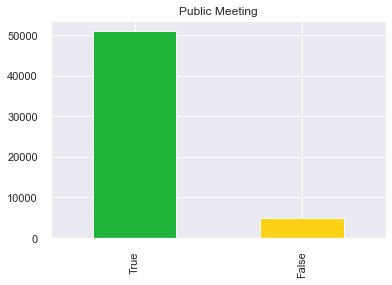

In [66]:
Train.public_meeting.value_counts().plot(kind='bar', color=tanzania_flag_colors);
plt.title("Public Meeting")

In [67]:
# Categorical features of interest
sample_categorical_features = ['scheme_management']
for i in sample_categorical_features:
    print("***** \'{}\' feature distribution breakdown *****".format(i))
    #print(categorical_features_data[i].value_counts())
    sns.set(style='darkgrid')
    fig = plt.figure(figsize = (20,4))
    sns.countplot(x=i,data=Train, order = Train[i].value_counts().index)
    plt.show()

***** 'scheme_management' feature distribution breakdown *****


KeyError: 'scheme_management'

<Figure size 1440x288 with 0 Axes>

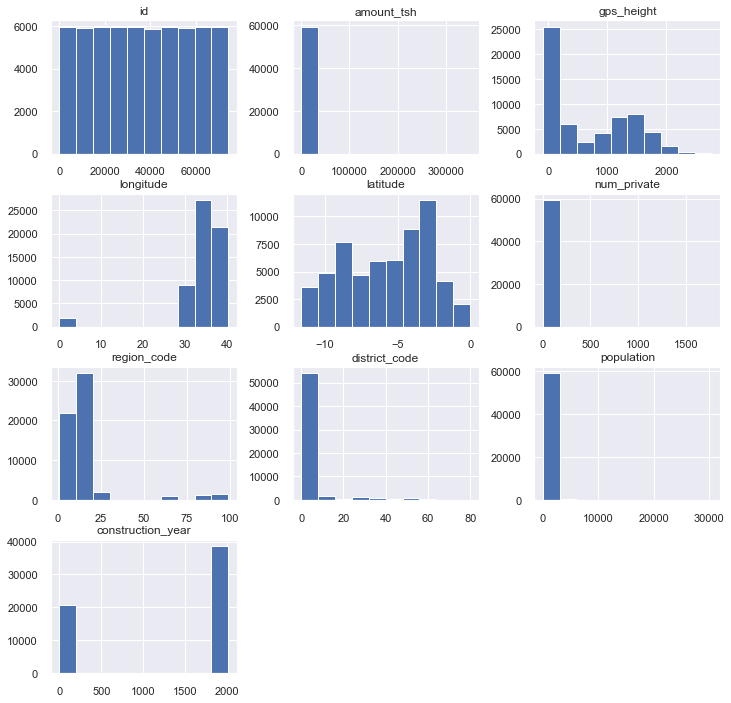

In [68]:
#show the histogram
Train.hist(figsize=(12,12))
plt.show();

Test

In [69]:
Test_value.shape

(14850, 40)

In [70]:
Test_value.head()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,50785,0.0,2013-02-04,Dmdd,1996,DMDD,35.290799,-4.059696,Dinamu Secondary School,0,...,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,other,other
1,51630,0.0,2013-02-04,Government Of Tanzania,1569,DWE,36.656709,-3.309214,Kimnyak,0,...,never pay,soft,good,insufficient,insufficient,spring,spring,groundwater,communal standpipe,communal standpipe
2,17168,0.0,2013-02-01,NaN,1567,NaN,34.767863,-5.004344,Puma Secondary,0,...,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,other,other
3,45559,0.0,2013-01-22,Finn Water,267,FINN WATER,38.058046,-9.418672,Kwa Mzee Pange,0,...,unknown,soft,good,dry,dry,shallow well,shallow well,groundwater,other,other
4,49871,500.0,2013-03-27,Bruder,1260,BRUDER,35.006123,-10.950412,Kwa Mzee Turuka,0,...,monthly,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe


In [71]:
Test_value.tail()

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
14845,39307,0.0,2011-02-24,Danida,34,Da,38.852669,-6.582841,Kwambwezi,0,...,never pay,soft,good,enough,enough,river,river/lake,surface,communal standpipe,communal standpipe
14846,18990,1000.0,2011-03-21,Hiap,0,HIAP,37.451633,-5.350428,Bonde La Mkondoa,0,...,annually,salty,salty,insufficient,insufficient,shallow well,shallow well,groundwater,hand pump,hand pump
14847,28749,0.0,2013-03-04,NaN,1476,NaN,34.739804,-4.585587,Bwawani,0,...,never pay,soft,good,insufficient,insufficient,dam,dam,surface,communal standpipe,communal standpipe
14848,33492,0.0,2013-02-18,Germany,998,DWE,35.432732,-10.584159,Kwa John,0,...,never pay,soft,good,insufficient,insufficient,river,river/lake,surface,communal standpipe,communal standpipe
14849,68707,0.0,2013-02-13,Government Of Tanzania,481,Government,34.765054,-11.226012,Kwa Mzee Chagala,0,...,never pay,soft,good,dry,dry,spring,spring,groundwater,communal standpipe,communal standpipe


In [19]:
import pandas_profiling
# Generate a profile report of the data to examine. 
pandas_profiling.ProfileReport(Test_value)

Summarize dataset:   0%|          | 0/52 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [72]:
Test_value.columns

Index(['id', 'amount_tsh', 'date_recorded', 'funder', 'gps_height',
       'installer', 'longitude', 'latitude', 'wpt_name', 'num_private',
       'basin', 'subvillage', 'region', 'region_code', 'district_code', 'lga',
       'ward', 'population', 'public_meeting', 'recorded_by',
       'scheme_management', 'scheme_name', 'permit', 'construction_year',
       'extraction_type', 'extraction_type_group', 'extraction_type_class',
       'management', 'management_group', 'payment', 'payment_type',
       'water_quality', 'quality_group', 'quantity', 'quantity_group',
       'source', 'source_type', 'source_class', 'waterpoint_type',
       'waterpoint_type_group'],
      dtype='object')

In [73]:
# Check for Duplicate values
Train.duplicated().sum()


0

In [74]:
# Check for Duplicate values
Test_value.duplicated().sum()

0

Missing value Impute(Train Dataset)

In [32]:
# Check for nulls.

Train.apply(lambda x: sum(x.isnull()))

id                           0
amount_tsh                   0
date_recorded                0
funder                       0
gps_height                   0
installer                    0
longitude                    0
latitude                     0
wpt_name                     0
num_private                  0
basin                        0
subvillage                 371
region                       0
region_code                  0
district_code                0
lga                          0
ward                         0
population                   0
public_meeting            3334
recorded_by                  0
scheme_management         3877
scheme_name              28166
permit                    3056
construction_year            0
extraction_type              0
extraction_type_group        0
extraction_type_class        0
management                   0
management_group             0
payment                      0
payment_type                 0
water_quality                0
quality_

In [75]:
def funder_wrangler(row):  
    '''Keep top 5 values and set the rest to 'other'''

    if row['funder']=='Government Of Tanzania':
        return 'gov'
    elif row['funder']=='Danida':
        return 'danida'
    elif row['funder']=='Hesawa':
        return 'hesawa'
    elif row['funder']=='Rwssp':
        return 'rwssp'
    elif row['funder']=='World Bank':
        return 'world_bank'    
    else:
        return 'other'
    
Train['funder'] = Train.apply(lambda row: funder_wrangler(row), axis=1)

In [76]:
Train.installer.value_counts()

DWE                 17402
Government           1825
RWE                  1206
Commu                1060
DANIDA               1050
                    ...  
RWEDWE                  1
Mzee Omari              1
LIZAD                   1
TWENDE PAMOJA           1
TANEDAPS Society        1
Name: installer, Length: 2145, dtype: int64

In [77]:
def installer_wrangler(row):  
    '''Keep top 5 values and set the rest to 'other'''

    if row['installer']=='DWE':
        return 'dwe'
    elif row['installer']=='Government':
        return 'gov'
    elif row['installer']=='RWE':
        return 'rwe'
    elif row['installer']=='Commu':
        return 'commu'
    elif row['installer']=='DANIDA':
        return 'danida'    
    else:
        return 'other'
    
Train['installer'] = Train.apply(lambda row: installer_wrangler(row), axis=1)

In [78]:
#Drop Subvillage

Train = Train.drop('subvillage', axis=1)

In [79]:
Train = Train.drop('date_recorded', axis=1)

In [80]:
# Replace Public_meeting missing values by unknown

Train['public_meeting'].fillna(Train['public_meeting'].mode()[0], inplace=True)

In [81]:
Train.scheme_management.value_counts()

VWC                 36793
WUG                  5206
Water authority      3153
WUA                  2883
Water Board          2748
Parastatal           1680
Private operator     1063
Company              1061
Other                 766
SWC                    97
Trust                  72
None                    1
Name: scheme_management, dtype: int64

In [82]:
def scheme_management_wrangler(row):  
    '''Keep top 5 values and set the rest to 'other'''

    if row['scheme_management']=='VWC':
        return 'vwc'
    elif row['scheme_management']=='WUG':
        return 'wug'
    elif row['scheme_management']=='Water authority':
        return 'wtr_auth'
    elif row['scheme_management']=='WUA':
        return 'wua'
    elif row['scheme_management']=='Water Board':
        return 'wtr_brd'    
    else:
        return 'other'
    
Train['scheme_management'] = Train.apply(lambda row: scheme_management_wrangler(row), axis=1)

In [83]:
Train.scheme_name.value_counts()

K                                                 682
None                                              644
Borehole                                          546
Chalinze wate                                     405
M                                                 400
                                                 ... 
Handeni Trunk Maini(                                1
Mongwe r                                            1
Mweka                                               1
Nyamtukuza Point sources water supplier supply      1
Kisogwe                                             1
Name: scheme_name, Length: 2696, dtype: int64

In [84]:
#Drop scheme_name

Train = Train.drop('scheme_name', axis=1)

In [85]:
# Fill NaN value with the mode. 
Train['permit'].fillna(Train['permit'].mode()[0], inplace=True)

In [86]:
# Verify is there any nulls.

Train.apply(lambda x: sum(x.isnull()))

id                       0
amount_tsh               0
funder                   0
gps_height               0
installer                0
longitude                0
latitude                 0
wpt_name                 0
num_private              0
basin                    0
region                   0
region_code              0
district_code            0
lga                      0
ward                     0
population               0
public_meeting           0
recorded_by              0
scheme_management        0
permit                   0
construction_year        0
extraction_type          0
extraction_type_group    0
extraction_type_class    0
management               0
management_group         0
payment                  0
payment_type             0
water_quality            0
quality_group            0
quantity                 0
quantity_group           0
source                   0
source_type              0
source_class             0
waterpoint_type          0
waterpoint_type_group    0
s

Missing value Impute(Test Dataset)

In [87]:
# Check for nulls.

Test_value.apply(lambda x: sum(x.isnull()))

id                          0
amount_tsh                  0
date_recorded               0
funder                    869
gps_height                  0
installer                 877
longitude                   0
latitude                    0
wpt_name                    0
num_private                 0
basin                       0
subvillage                 99
region                      0
region_code                 0
district_code               0
lga                         0
ward                        0
population                  0
public_meeting            821
recorded_by                 0
scheme_management         969
scheme_name              7092
permit                    737
construction_year           0
extraction_type             0
extraction_type_group       0
extraction_type_class       0
management                  0
management_group            0
payment                     0
payment_type                0
water_quality               0
quality_group               0
quantity  

In [89]:
def funder_wrangler(row):  
    '''Keep top 5 values and set the rest to 'other'''

    if row['funder']=='Government Of Tanzania':
        return 'gov'
    elif row['funder']=='Danida':
        return 'danida'
    elif row['funder']=='Hesawa':
        return 'hesawa'
    elif row['funder']=='Rwssp':
        return 'rwssp'
    elif row['funder']=='World Bank':
        return 'world_bank'    
    else:
        return 'other'
    
Test_value['funder'] = Test_value.apply(lambda row: funder_wrangler(row), axis=1)

In [91]:
Test_value.installer.value_counts()

DWE                   4349
Government             457
RWE                    292
Commu                  287
DANIDA                 255
                      ... 
CANACO                   1
O &                      1
Mr Jenifred Mbunda       1
KKKT Mso                 1
ir                       1
Name: installer, Length: 1091, dtype: int64

In [92]:
def installer_wrangler(row):  
    '''Keep top 5 values and set the rest to 'other'''

    if row['installer']=='DWE':
        return 'dwe'
    elif row['installer']=='Government':
        return 'gov'
    elif row['installer']=='RWE':
        return 'rwe'
    elif row['installer']=='Commu':
        return 'commu'
    elif row['installer']=='DANIDA':
        return 'danida'    
    else:
        return 'other'
    
Test_value['installer'] = Test_value.apply(lambda row: installer_wrangler(row), axis=1)

In [93]:
#Drop Subvillage

Test_value = Test_value.drop('subvillage', axis=1)

In [94]:
#Drop Date Recorded
Test_value = Test_value.drop('date_recorded', axis=1)

In [95]:
# Replace Public_meeting missing values by unknown

Test_value['public_meeting'].fillna(Test_value['public_meeting'].mode()[0], inplace=True)

In [96]:
Test_value.scheme_management.value_counts()

VWC                 9124
WUG                 1290
Water authority      822
Water Board          714
WUA                  668
Parastatal           444
Company              280
Private operator     263
Other                230
SWC                   26
Trust                 20
Name: scheme_management, dtype: int64

In [97]:
def scheme_management_wrangler(row):  
    '''Keep top 5 values and set the rest to 'other'''

    if row['scheme_management']=='VWC':
        return 'vwc'
    elif row['scheme_management']=='WUG':
        return 'wug'
    elif row['scheme_management']=='Water authority':
        return 'wtr_auth'
    elif row['scheme_management']=='WUA':
        return 'wua'
    elif row['scheme_management']=='Water Board':
        return 'wtr_brd'    
    else:
        return 'other'
    
Test_value['scheme_management'] = Test_value.apply(lambda row: scheme_management_wrangler(row), axis=1)

In [98]:
Test_value.scheme_name.value_counts()

K                                 176
Borehole                          158
None                              150
DANIDA                            104
Chalinze wate                      96
                                 ... 
BL Orkugu                           1
Kibuye gravity water supply         1
Nyaruyoba/Kasaka gravity water      1
Ngiresi pipe line                   1
Kumsasa spring source               1
Name: scheme_name, Length: 1789, dtype: int64

In [99]:
#Drop scheme_name

Test_value = Test_value.drop('scheme_name', axis=1)

In [100]:
# Fill NaN value with the mode. 
Test_value['permit'].fillna(Test_value['permit'].mode()[0], inplace=True)

In [102]:
# Verify is there any nulls.

Test_value.apply(lambda x: sum(x.isnull()))

id                       0
amount_tsh               0
funder                   0
gps_height               0
installer                0
longitude                0
latitude                 0
wpt_name                 0
num_private              0
basin                    0
region                   0
region_code              0
district_code            0
lga                      0
ward                     0
population               0
public_meeting           0
recorded_by              0
scheme_management        0
permit                   0
construction_year        0
extraction_type          0
extraction_type_group    0
extraction_type_class    0
management               0
management_group         0
payment                  0
payment_type             0
water_quality            0
quality_group            0
quantity                 0
quantity_group           0
source                   0
source_type              0
source_class             0
waterpoint_type          0
waterpoint_type_group    0
d

In [103]:
#Allocate variable to X and target variable 'Statusgroup' to y 
y = Train[(['status_group'])].values
X = Train.drop(['status_group'], axis=1)

In [104]:
X

,id,amount_tsh,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,69572,6000.0,other,1390,other,34.938093,-9.856322,none,0,Lake Nyasa,...,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
1,8776,0.0,other,1399,other,34.698766,-2.147466,Zahanati,0,Lake Victoria,...,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe
2,34310,25.0,other,686,other,37.460664,-3.821329,Kwa Mahundi,0,Pangani,...,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe
3,67743,0.0,other,263,other,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,...,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe
4,19728,0.0,other,0,other,31.130847,-1.825359,Shuleni,0,Lake Victoria,...,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59395,60739,10.0,other,1210,other,37.169807,-3.253847,Area Three Namba 27,0,Pangani,...,per bucket,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
59396,27263,4700.0,other,1212,other,35.249991,-9.070629,Kwa Yahona Kuvala,0,Rufiji,...,annually,soft,good,enough,enough,river,river/lake,surface,communal standpipe,communal standpipe
59397,37057,0.0,other,0,other,34.017087,-8.750434,Mashine,0,Rufiji,...,monthly,fluoride,fluoride,enough,enough,machine dbh,borehole,groundwater,hand pump,hand pump
59398,31282,0.0,other,0,other,35.861315,-6.378573,Mshoro,0,Rufiji,...,never pay,soft,good,insufficient,insufficient,shallow well,shallow well,groundwater,hand pump,hand pump


In [105]:
X = pd.get_dummies(X)

Scaling

In [106]:
from sklearn.preprocessing import MinMaxScaler, RobustScaler, StandardScaler

s_scaler = StandardScaler()
standard_X = s_scaler.fit_transform(X)

MemoryError: Unable to allocate 17.6 GiB for an array with shape (39792, 59400) and data type object

In [ ]:
standard_df = pd.DataFrame(standard_X, index=X.index, columns=X.columns)

Split the dataset

In [107]:
#Load the Libraries
from sklearn.model_selection import train_test_split 
#Split the data set 
X_train, X_test, y_train, y_test = train_test_split(standard_X, y, test_size=.20, random_state=19)

Model

In [108]:
#Decision Tree

dt = DecisionTreeClassifier(random_state=19)
dt.fit(X_train, y_train)

MemoryError: Unable to allocate 14.1 GiB for an array with shape (39804, 47520) and data type object

In [ ]:
y_preds_decision = dt.predict(X_test)

In [ ]:
accuracy_score(y_test, y_preds_decision)

In [ ]:
f1_score(y_test, y_preds_decision, average='micro')

In [ ]:
# Create a confusion matrix for Decision tree model.
print(classification_report(y_test, y_preds_decision))
pd.DataFrame(confusion_matrix(y_test, y_preds_decision), 
             columns=['Pred +', 'Pred Fix', 'Pred -'], 
             index=['Act +', 'Pred Fix', 'Act -'])

In [ ]:
#Random Forest
rf = RandomForestClassifier(random_state=19)
rf.fit(X_train, y_train)

In [ ]:
y_preds_rf = rf.predict(X_test)

In [ ]:
# Create a confusion matrix for K=1 model.
print(classification_report(y_test, y_preds_rf))
pd.DataFrame(confusion_matrix(y_test, y_preds_rf), 
             columns=['Pred +', 'Pred Fix', 'Pred -'], 
             index=['Act +', 'Pred Fix', 'Act -'])

In [ ]:
# Visualize effect of different max_depths on AUC scores

max_depths = np.linspace(1,32,32,endpoint=True)
train_auc = []
test_auc = []

for depth in max_depths:
    
    rf = RandomForestClassifier(max_depth=depth)
    rf.fit(X_train, y_train)
    train_pred = rf.predict(X_train)
    fpr, tpr, thresh = roc_curve(y_train, train_pred)
    roc_auc = auc(fpr, tpr)
    train_auc.append(roc_auc)
    
    test_pred = rf.predict(X_test)
    fpr, tpr, thresh = roc_curve(y_test, test_pred)
    roc_auc = auc(fpr, tpr)
    test_auc.append(roc_auc)

plt.figure(figsize=(10,8))
plt.plot(max_depths, train_auc, color=tanzania_flag_colors[0], label='Train AUC')
plt.plot(max_depths, test_auc, color=tanzania_flag_colors[1], label='Test AUC')
plt.xlabel('Tree Depth')
plt.ylabel('AUC Scores')
plt.legend(loc='best')
plt.show();

In [ ]:
#Logistic Regression


# define the model and call it classifier_LR
classifier_LR = LogisticRegression()

# train classifier_LR on the training data
classifier_LR.fit(X_train, y_train)

# This is a regression, so it has coefficients -- lets see them
# Note, there is no easy way to show significance, etc. with sklearn
print('Intercept: ' + str(classifier_LR.intercept_))
print('Coefficients (10 largest and 10 smallest) [recall, there are 252 of them, in total: ')
summary = pd.DataFrame([X_test.columns,classifier_LR.coef_[0]]).transpose().sort_values(by = 1, ascending = False)
summary.columns = ['Variable','Coefficient']
top10positive = summary.head(10) # 10 largest (by value)
top10negative = summary.tail(10) # 10 smallest (by value)
top10list=pd.DataFrame()
top10list= top10list.append(pd.DataFrame(data = top10positive))
top10list= top10list.append(pd.DataFrame(data = top10negative))
top10list

In [ ]:
 Use the trained model to predict testing data

y_pred_prob = classifier_LR.predict_proba(X_test)

In [ ]:
# Create a confusion matrix for Logistic  model.
print(classification_report(y_test, y_pred_prob))
pd.DataFrame(confusion_matrix(y_test,y_pred_prob), 
             columns=['Pred +', 'Pred Fix', 'Pred -'], 
             index=['Act +', 'Pred Fix', 'Act -'])

In [ ]:
#Gradient boosting 

# Define the gradient boosting machine model and call it classifier_GBM
classifier_GBM = GradientBoostingClassifier(random_state=77300)

# Train the model classifier_GBM on the training data
classifier_GBM.fit(X_train, y_train)

In [ ]:
y_preds_GBM = classifier_GBM.predict(X_test)

In [ ]:
# Create a confusion matrix for K=1 model.
print(classification_report(y_test, y_preds_GBM))
pd.DataFrame(confusion_matrix(y_test, y_preds_GBM), 
             columns=['Pred +', 'Pred Fix', 'Pred -'], 
             index=['Act +', 'Pred Fix', 'Act -'])